In [19]:
import os

import pandas as pd
import numpy as np
from pathlib import Path

import requests
import json
import pandas as pd
import numpy as np
from pandas.io.json import json_normalize

import webbrowser
import folium
from folium import plugins

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import font_manager, rc, rcParams 
import seaborn as sns

In [45]:
print(mpl.__version__)
print(mpl.__file__)
print(mpl.get_configdir())
print(mpl.get_cachedir())

plt.rcParams["font.family"] = 'NanumGothic'
plt.rcParams['axes.unicode_minus'] = False
# fm._rebuild()

3.3.4
C:\Users\admin\Anaconda3\lib\site-packages\matplotlib\__init__.py
C:\Users\admin\.matplotlib
C:\Users\admin\.matplotlib


In [16]:
# data_path = Path('./data')
# feature = 'pp'
# feature_path = data_path / feature
# or_path = feature_path / 'original'
# geojson_path = data_path / 'geojson'

# save_path = feature_path / 'preprocessing'

# data_list = list(or_path.glob('*'))
# pp_list = list(save_path.glob('*'))
# pp_list

[]

In [56]:
data_dir = './data'
data_list = os.listdir(data_dir)
# geojson_path = './data/geojson'
data_list

['.ipynb_checkpoints',
 '0.인구총조사_인구_시도_시_군_구__20210819221723.csv',
 '1.총조사인구_총괄_시군구_성_5세연령별__20210819222310.csv',
 '1인당_개인소득_시도__20210630210530.csv',
 'geojson',
 'sido_pp_(15_19).csv',
 'TL_SCCO_CTPRVN_WGS84.json',
 '규모별_(16~19).csv',
 '규모별_(20~21).csv',
 '규모별_year(16~20)',
 '분기별 전입(00~21).csv',
 '산업별·규모별(09~19).csv',
 '산업별·규모별2020.csv',
 '시군구별 인구(05~19).csv',
 '시군구별_이동자수_20210630203834.csv',
 '인구증가율_시도_시_군_구__20210723090545.csv',
 '전입,전출(16~20,연별).csv',
 '중위연령, 평균연령(00~19).csv',
 '직종별·규모별(09~19).csv',
 '직종별·규모별2020.csv',
 '청년고용률_시도__20210630210933.csv']

In [ ]:
현원 (명), 구인인원 (명), 채용인원 (명), 미충원인원 (명), 부족인원 (명), 채용계획인원 (명), 부족률 (%)

In [54]:
df.iloc[0,:].unique()

array(['시도별(17개)', '규모별', '산업분류별', '현원 (명)', '구인인원 (명)', '채용인원 (명)',
       '미충원인원 (명)', '부족인원 (명)', '채용계획인원 (명)', '부족률 (%)'], dtype=object)

In [52]:
df = pd.read_csv(os.path.join(data_dir, data_list[4]))
df.head()

,시도별(17개),규모별,산업분류별,2016 1/2,2016 1/2.1,2016 1/2.2,2016 1/2.3,2016 1/2.4,2016 1/2.5,2016 1/2.6,...,2019 1/2.4,2019 1/2.5,2019 1/2.6,2019 2/2,2019 2/2.1,2019 2/2.2,2019 2/2.3,2019 2/2.4,2019 2/2.5,2019 2/2.6
0,시도별(17개),규모별,산업분류별,현원 (명),구인인원 (명),채용인원 (명),미충원인원 (명),부족인원 (명),채용계획인원 (명),부족률 (%),...,부족인원 (명),채용계획인원 (명),부족률 (%),현원 (명),구인인원 (명),채용인원 (명),미충원인원 (명),부족인원 (명),채용계획인원 (명),부족률 (%)
1,전국,전규모(5인이상),전산업(5인이상),10932690,819778,729198,90580,292989,312409,2.6,...,235190,251012,1.9,12018829,672671,598269,74402,241402,255867,2.0
2,전국,10인이상,전산업(5인이상),8953845,651711,581741,69970,205707,225680,2.2,...,176240,190790,1.8,9729429,539290,475503,63787,185977,200149,1.9
3,전국,중소규모(300인 미만),전산업(5인이상),8679291,666862,582145,84717,267079,279653,3.0,...,213052,219761,2.2,9531988,529980,462367,67613,211013,219376,2.2
4,전국,1규모(5~9인),전산업(5인이상),1978845,168067,147457,20610,87282,86729,4.2,...,58950,60222,2.6,2289400,133381,122766,10615,55425,55718,2.4


In [31]:
df1 = pd.read_csv(os.path.join(data_dir, data_list[3]))
df1.drop(columns = ['시도별(17개)', '규모별', '산업분류별','2021 1/2',
       '2021 1/2.1', '2021 1/2.2', '2021 1/2.3', '2021 1/2.4', '2021 1/2.5',
       '2021 1/2.6'],inplace = True)
df1.head()

,2020 1/2,2020 1/2.1,2020 1/2.2,2020 1/2.3,2020 1/2.4,2020 1/2.5,2020 1/2.6,2020 2/2,2020 2/2.1,2020 2/2.2,2020 2/2.3,2020 2/2.4,2020 2/2.5,2020 2/2.6
0,현원 (명),구인인원 (명),채용인원 (명),미충원인원 (명),부족인원 (명),채용계획인원 (명),부족률 (%),현원 (명),구인인원 (명),채용인원 (명),미충원인원 (명),부족인원 (명),채용계획인원 (명),부족률 (%)
1,12302576,793093,733997,59096,223126,238199,1.8,12320546,621350,556807,64543,238002,253067,1.9
2,9991443,628486,580005,48481,162712,177595,1.6,9941479,497629,444302,53327,176261,192661,1.7
3,9709939,636179,583661,52518,196543,207514,2.0,9728109,494030,435621,58409,209863,218282,2.1
4,2311132,164607,153992,10615,60414,60604,2.5,2379068,123721,112505,11216,61741,60406,2.5


In [32]:
df3 = pd.concat([df,df1], axis = 1)
df3.drop(columns = '산업분류별', inplace = True)
df3.drop(index = 0, inplace = True)
df3 = df3.reset_index().drop(['index'], axis=1)
df3

,시도별(17개),규모별,2016 1/2,2016 1/2.1,2016 1/2.2,2016 1/2.3,2016 1/2.4,2016 1/2.5,2016 1/2.6,2016 2/2,...,2020 1/2.4,2020 1/2.5,2020 1/2.6,2020 2/2,2020 2/2.1,2020 2/2.2,2020 2/2.3,2020 2/2.4,2020 2/2.5,2020 2/2.6
0,전국,전규모(5인이상),10932690,819778,729198,90580,292989,312409,2.6,11132595,...,223126,238199,1.8,12320546,621350,556807,64543,238002,253067,1.9
1,전국,10인이상,8953845,651711,581741,69970,205707,225680,2.2,9028997,...,162712,177595,1.6,9941479,497629,444302,53327,176261,192661,1.7
2,전국,중소규모(300인 미만),8679291,666862,582145,84717,267079,279653,3.0,8893199,...,196543,207514,2.0,9728109,494030,435621,58409,209863,218282,2.1
3,전국,1규모(5~9인),1978845,168067,147457,20610,87282,86729,4.2,2103598,...,60414,60604,2.5,2379068,123721,112505,11216,61741,60406,2.5
4,전국,2규모(10~29인),2702232,205072,179944,25128,81685,82960,2.9,2744754,...,54291,56322,1.7,3034961,147120,131204,15916,60899,64757,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139,제주특별자치도,1규모(5~9인),26281,2218,1693,525,1412,1363,5.1,28030,...,599,670,1.9,30962,1258,1152,106,518,547,1.6
140,제주특별자치도,2규모(10~29인),31764,2538,2037,501,1375,1380,4.1,35044,...,476,477,1.2,38279,1741,1624,117,836,950,2.1
141,제주특별자치도,3규모(30~99인),23768,1868,1489,379,865,876,3.5,24188,...,422,440,1.6,26234,1370,1243,127,359,455,1.3
142,제주특별자치도,4규모(100~299인),13301,879,773,106,307,320,2.3,13346,...,226,247,1.4,15245,634,594,40,184,203,1.2


In [33]:
df3.iloc[:,2:] = df3.iloc[:,2:].astype('float')

In [17]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144 entries, 0 to 143
Data columns (total 72 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   시도별(17개)    144 non-null    object
 1   규모별         144 non-null    object
 2   2016 1/2    144 non-null    object
 3   2016 1/2.1  144 non-null    object
 4   2016 1/2.2  144 non-null    object
 5   2016 1/2.3  144 non-null    object
 6   2016 1/2.4  144 non-null    object
 7   2016 1/2.5  144 non-null    object
 8   2016 1/2.6  144 non-null    object
 9   2016 2/2    144 non-null    object
 10  2016 2/2.1  144 non-null    object
 11  2016 2/2.2  144 non-null    object
 12  2016 2/2.3  144 non-null    object
 13  2016 2/2.4  144 non-null    object
 14  2016 2/2.5  144 non-null    object
 15  2016 2/2.6  144 non-null    object
 16  2017 1/2    144 non-null    object
 17  2017 1/2.1  144 non-null    object
 18  2017 1/2.2  144 non-null    object
 19  2017 1/2.3  144 non-null    object
 20  2017 1/2.4

In [27]:
df3['2016 1/2']+df3['2016 2/2']

0      22065285.0
1      17982842.0
2      17572490.0
3       4082443.0
4       5446986.0
          ...    
139       54311.0
140       66808.0
141       47956.0
142       26647.0
143       16391.0
Length: 144, dtype: object

In [28]:
a = df.columns[3:]
a

Index(['2016 1/2', '2016 1/2.1', '2016 1/2.2', '2016 1/2.3', '2016 1/2.4',
       '2016 1/2.5', '2016 1/2.6', '2016 2/2', '2016 2/2.1', '2016 2/2.2',
       '2016 2/2.3', '2016 2/2.4', '2016 2/2.5', '2016 2/2.6', '2017 1/2',
       '2017 1/2.1', '2017 1/2.2', '2017 1/2.3', '2017 1/2.4', '2017 1/2.5',
       '2017 1/2.6', '2017 2/2', '2017 2/2.1', '2017 2/2.2', '2017 2/2.3',
       '2017 2/2.4', '2017 2/2.5', '2017 2/2.6', '2018 1/2', '2018 1/2.1',
       '2018 1/2.2', '2018 1/2.3', '2018 1/2.4', '2018 1/2.5', '2018 1/2.6',
       '2018 2/2', '2018 2/2.1', '2018 2/2.2', '2018 2/2.3', '2018 2/2.4',
       '2018 2/2.5', '2018 2/2.6', '2019 1/2', '2019 1/2.1', '2019 1/2.2',
       '2019 1/2.3', '2019 1/2.4', '2019 1/2.5', '2019 1/2.6', '2019 2/2',
       '2019 2/2.1', '2019 2/2.2', '2019 2/2.3', '2019 2/2.4', '2019 2/2.5',
       '2019 2/2.6'],
      dtype='object')

In [35]:
df3.columns

Index(['시도별(17개)', '규모별', '2016 1/2', '2016 1/2.1', '2016 1/2.2', '2016 1/2.3',
       '2016 1/2.4', '2016 1/2.5', '2016 1/2.6', '2016 2/2',
       ...
       '2019.4', '2019.5', '2019.6', '2020', '2020.1', '2020.2', '2020.3',
       '2020.4', '2020.5', '2020.6'],
      dtype='object', length=107)

In [57]:
df4 = pd.DataFrame()

In [58]:
for i in range(2016,2021):
    df4['{}'.format(i)] = df3['{} 1/2'.format(i)]+df3['{} 2/2'.format(i)]
    df4['{}.1'.format(i)] = df3['{} 1/2.1'.format(i)]+df3['{} 2/2.1'.format(i)]
    df4['{}.2'.format(i)] = df3['{} 1/2.2'.format(i)]+df3['{} 2/2.2'.format(i)]
    df4['{}.3'.format(i)] = df3['{} 1/2.3'.format(i)]+df3['{} 2/2.3'.format(i)]
    df4['{}.4'.format(i)] = df3['{} 1/2.4'.format(i)]+df3['{} 2/2.4'.format(i)]
    df4['{}.5'.format(i)] = df3['{} 1/2.5'.format(i)]+df3['{} 2/2.5'.format(i)]
    df4['{}.6'.format(i)] = (df3['{} 1/2.6'.format(i)]+df3['{} 2/2.6'.format(i)])/2
df4

,2016,2016.1,2016.2,2016.3,2016.4,2016.5,2016.6,2017,2017.1,2017.2,...,2019.4,2019.5,2019.6,2020,2020.1,2020.2,2020.3,2020.4,2020.5,2020.6
0,22065285.0,1522989.0,1342771.0,180218.0,576390.0,616773.0,2.55,23304699.0,1571161.0,1392839.0,...,476592.0,506879.0,1.95,24623122.0,1414443.0,1290804.0,123639.0,461128.0,491266.0,1.85
1,17982842.0,1201720.0,1064930.0,136790.0,401748.0,440936.0,2.15,19099267.0,1263018.0,1121843.0,...,362217.0,390939.0,1.85,19932922.0,1126115.0,1024307.0,101808.0,338973.0,370256.0,1.65
2,17572490.0,1251614.0,1083224.0,168390.0,527851.0,554225.0,2.9,18576482.0,1272084.0,1108191.0,...,424065.0,439137.0,2.2,19438048.0,1130209.0,1019282.0,110927.0,406406.0,425796.0,2.05
3,4082443.0,321269.0,277841.0,43428.0,174642.0,175837.0,4.1,4205432.0,308143.0,270996.0,...,114375.0,115940.0,2.5,4690200.0,288328.0,266497.0,21831.0,122155.0,121010.0,2.5
4,5446986.0,386257.0,336989.0,49268.0,158904.0,162830.0,2.8,5757575.0,366535.0,323982.0,...,118588.0,122328.0,1.95,6099878.0,339673.0,310234.0,29439.0,115190.0,121079.0,1.85
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139,54311.0,4138.0,3175.0,963.0,3223.0,3147.0,5.6,54943.0,2920.0,2630.0,...,1438.0,1347.0,2.35,62336.0,2357.0,2244.0,113.0,1117.0,1217.0,1.75
140,66808.0,4830.0,3854.0,976.0,2590.0,2556.0,3.75,68271.0,5276.0,4439.0,...,1366.0,1285.0,1.85,76036.0,2975.0,2827.0,148.0,1312.0,1427.0,1.65
141,47956.0,3736.0,2938.0,798.0,1672.0,1681.0,3.35,50669.0,3298.0,2667.0,...,956.0,968.0,1.9,52074.0,3183.0,2929.0,254.0,781.0,895.0,1.45
142,26647.0,3024.0,2859.0,165.0,560.0,575.0,2.1,26896.0,2730.0,2494.0,...,294.0,312.0,1.15,30744.0,965.0,911.0,54.0,410.0,450.0,1.3


In [59]:
df4['시도별(17개)'] = df3['시도별(17개)']
df4['규모별'] = df3['규모별']
df4

,2016,2016.1,2016.2,2016.3,2016.4,2016.5,2016.6,2017,2017.1,2017.2,...,2019.6,2020,2020.1,2020.2,2020.3,2020.4,2020.5,2020.6,시도별(17개),규모별
0,22065285.0,1522989.0,1342771.0,180218.0,576390.0,616773.0,2.55,23304699.0,1571161.0,1392839.0,...,1.95,24623122.0,1414443.0,1290804.0,123639.0,461128.0,491266.0,1.85,전국,전규모(5인이상)
1,17982842.0,1201720.0,1064930.0,136790.0,401748.0,440936.0,2.15,19099267.0,1263018.0,1121843.0,...,1.85,19932922.0,1126115.0,1024307.0,101808.0,338973.0,370256.0,1.65,전국,10인이상
2,17572490.0,1251614.0,1083224.0,168390.0,527851.0,554225.0,2.9,18576482.0,1272084.0,1108191.0,...,2.2,19438048.0,1130209.0,1019282.0,110927.0,406406.0,425796.0,2.05,전국,중소규모(300인 미만)
3,4082443.0,321269.0,277841.0,43428.0,174642.0,175837.0,4.1,4205432.0,308143.0,270996.0,...,2.5,4690200.0,288328.0,266497.0,21831.0,122155.0,121010.0,2.5,전국,1규모(5~9인)
4,5446986.0,386257.0,336989.0,49268.0,158904.0,162830.0,2.8,5757575.0,366535.0,323982.0,...,1.95,6099878.0,339673.0,310234.0,29439.0,115190.0,121079.0,1.85,전국,2규모(10~29인)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139,54311.0,4138.0,3175.0,963.0,3223.0,3147.0,5.6,54943.0,2920.0,2630.0,...,2.35,62336.0,2357.0,2244.0,113.0,1117.0,1217.0,1.75,제주특별자치도,1규모(5~9인)
140,66808.0,4830.0,3854.0,976.0,2590.0,2556.0,3.75,68271.0,5276.0,4439.0,...,1.85,76036.0,2975.0,2827.0,148.0,1312.0,1427.0,1.65,제주특별자치도,2규모(10~29인)
141,47956.0,3736.0,2938.0,798.0,1672.0,1681.0,3.35,50669.0,3298.0,2667.0,...,1.9,52074.0,3183.0,2929.0,254.0,781.0,895.0,1.45,제주특별자치도,3규모(30~99인)
142,26647.0,3024.0,2859.0,165.0,560.0,575.0,2.1,26896.0,2730.0,2494.0,...,1.15,30744.0,965.0,911.0,54.0,410.0,450.0,1.3,제주특별자치도,4규모(100~299인)


In [48]:
df4.columns

Index(['2016', '2016.1', '2016.2', '2016.3', '2016.4', '2016.5', '2016.6',
       '2017', '2017.1', '2017.2', '2017.3', '2017.4', '2017.5', '2017.6',
       '2018', '2018.1', '2018.2', '2018.3', '2018.4', '2018.5', '2018.6',
       '2019', '2019.1', '2019.2', '2019.3', '2019.4', '2019.5', '2019.6',
       '2020', '2020.1', '2020.2', '2020.3', '2020.4', '2020.5', '2020.6',
       '시도별(17개)', '규모별'],
      dtype='object')

In [62]:
df4

,2016,2016.1,2016.2,2016.3,2016.4,2016.5,2016.6,2017,2017.1,2017.2,...,2019.6,2020,2020.1,2020.2,2020.3,2020.4,2020.5,2020.6,시도별(17개),규모별
0,22065285.0,1522989.0,1342771.0,180218.0,576390.0,616773.0,2.55,23304699.0,1571161.0,1392839.0,...,1.95,24623122.0,1414443.0,1290804.0,123639.0,461128.0,491266.0,1.85,전국,전규모(5인이상)
1,17982842.0,1201720.0,1064930.0,136790.0,401748.0,440936.0,2.15,19099267.0,1263018.0,1121843.0,...,1.85,19932922.0,1126115.0,1024307.0,101808.0,338973.0,370256.0,1.65,전국,10인이상
2,17572490.0,1251614.0,1083224.0,168390.0,527851.0,554225.0,2.9,18576482.0,1272084.0,1108191.0,...,2.2,19438048.0,1130209.0,1019282.0,110927.0,406406.0,425796.0,2.05,전국,중소규모(300인 미만)
3,4082443.0,321269.0,277841.0,43428.0,174642.0,175837.0,4.1,4205432.0,308143.0,270996.0,...,2.5,4690200.0,288328.0,266497.0,21831.0,122155.0,121010.0,2.5,전국,1규모(5~9인)
4,5446986.0,386257.0,336989.0,49268.0,158904.0,162830.0,2.8,5757575.0,366535.0,323982.0,...,1.95,6099878.0,339673.0,310234.0,29439.0,115190.0,121079.0,1.85,전국,2규모(10~29인)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139,54311.0,4138.0,3175.0,963.0,3223.0,3147.0,5.6,54943.0,2920.0,2630.0,...,2.35,62336.0,2357.0,2244.0,113.0,1117.0,1217.0,1.75,제주특별자치도,1규모(5~9인)
140,66808.0,4830.0,3854.0,976.0,2590.0,2556.0,3.75,68271.0,5276.0,4439.0,...,1.85,76036.0,2975.0,2827.0,148.0,1312.0,1427.0,1.65,제주특별자치도,2규모(10~29인)
141,47956.0,3736.0,2938.0,798.0,1672.0,1681.0,3.35,50669.0,3298.0,2667.0,...,1.9,52074.0,3183.0,2929.0,254.0,781.0,895.0,1.45,제주특별자치도,3규모(30~99인)
142,26647.0,3024.0,2859.0,165.0,560.0,575.0,2.1,26896.0,2730.0,2494.0,...,1.15,30744.0,965.0,911.0,54.0,410.0,450.0,1.3,제주특별자치도,4규모(100~299인)


In [63]:
df4.columns

Index(['2016', '2016.1', '2016.2', '2016.3', '2016.4', '2016.5', '2016.6',
       '2017', '2017.1', '2017.2', '2017.3', '2017.4', '2017.5', '2017.6',
       '2018', '2018.1', '2018.2', '2018.3', '2018.4', '2018.5', '2018.6',
       '2019', '2019.1', '2019.2', '2019.3', '2019.4', '2019.5', '2019.6',
       '2020', '2020.1', '2020.2', '2020.3', '2020.4', '2020.5', '2020.6',
       '시도별(17개)', '규모별'],
      dtype='object')

In [64]:
df4 = df4[['시도별(17개)', '규모별','2016', '2016.1', '2016.2', '2016.3', '2016.4', '2016.5', '2016.6','2017', '2017.1', '2017.2', '2017.3', '2017.4', '2017.5', '2017.6','2018', '2018.1', '2018.2', '2018.3', '2018.4', '2018.5', '2018.6','2019', '2019.1', '2019.2', '2019.3', '2019.4', '2019.5', '2019.6','2020', '2020.1', '2020.2', '2020.3', '2020.4', '2020.5', '2020.6']]
df4

,시도별(17개),규모별,2016,2016.1,2016.2,2016.3,2016.4,2016.5,2016.6,2017,...,2019.4,2019.5,2019.6,2020,2020.1,2020.2,2020.3,2020.4,2020.5,2020.6
0,전국,전규모(5인이상),22065285.0,1522989.0,1342771.0,180218.0,576390.0,616773.0,2.55,23304699.0,...,476592.0,506879.0,1.95,24623122.0,1414443.0,1290804.0,123639.0,461128.0,491266.0,1.85
1,전국,10인이상,17982842.0,1201720.0,1064930.0,136790.0,401748.0,440936.0,2.15,19099267.0,...,362217.0,390939.0,1.85,19932922.0,1126115.0,1024307.0,101808.0,338973.0,370256.0,1.65
2,전국,중소규모(300인 미만),17572490.0,1251614.0,1083224.0,168390.0,527851.0,554225.0,2.9,18576482.0,...,424065.0,439137.0,2.2,19438048.0,1130209.0,1019282.0,110927.0,406406.0,425796.0,2.05
3,전국,1규모(5~9인),4082443.0,321269.0,277841.0,43428.0,174642.0,175837.0,4.1,4205432.0,...,114375.0,115940.0,2.5,4690200.0,288328.0,266497.0,21831.0,122155.0,121010.0,2.5
4,전국,2규모(10~29인),5446986.0,386257.0,336989.0,49268.0,158904.0,162830.0,2.8,5757575.0,...,118588.0,122328.0,1.95,6099878.0,339673.0,310234.0,29439.0,115190.0,121079.0,1.85
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139,제주특별자치도,1규모(5~9인),54311.0,4138.0,3175.0,963.0,3223.0,3147.0,5.6,54943.0,...,1438.0,1347.0,2.35,62336.0,2357.0,2244.0,113.0,1117.0,1217.0,1.75
140,제주특별자치도,2규모(10~29인),66808.0,4830.0,3854.0,976.0,2590.0,2556.0,3.75,68271.0,...,1366.0,1285.0,1.85,76036.0,2975.0,2827.0,148.0,1312.0,1427.0,1.65
141,제주특별자치도,3규모(30~99인),47956.0,3736.0,2938.0,798.0,1672.0,1681.0,3.35,50669.0,...,956.0,968.0,1.9,52074.0,3183.0,2929.0,254.0,781.0,895.0,1.45
142,제주특별자치도,4규모(100~299인),26647.0,3024.0,2859.0,165.0,560.0,575.0,2.1,26896.0,...,294.0,312.0,1.15,30744.0,965.0,911.0,54.0,410.0,450.0,1.3


In [65]:
df4.to_csv('./data/규모별_year(16~20)')

In [66]:
df5 = pd.read_csv(os.path.join(data_dir, data_list[9]))
df5.drop(columns = 'Unnamed: 0', inplace = True)
df5

,시도별(17개),규모별,2016,2016.1,2016.2,2016.3,2016.4,2016.5,2016.6,2017,...,2019.4,2019.5,2019.6,2020,2020.1,2020.2,2020.3,2020.4,2020.5,2020.6
0,전국,전규모(5인이상),22065285.0,1522989.0,1342771.0,180218.0,576390.0,616773.0,2.55,23304699.0,...,476592.0,506879.0,1.95,24623122.0,1414443.0,1290804.0,123639.0,461128.0,491266.0,1.85
1,전국,10인이상,17982842.0,1201720.0,1064930.0,136790.0,401748.0,440936.0,2.15,19099267.0,...,362217.0,390939.0,1.85,19932922.0,1126115.0,1024307.0,101808.0,338973.0,370256.0,1.65
2,전국,중소규모(300인 미만),17572490.0,1251614.0,1083224.0,168390.0,527851.0,554225.0,2.90,18576482.0,...,424065.0,439137.0,2.20,19438048.0,1130209.0,1019282.0,110927.0,406406.0,425796.0,2.05
3,전국,1규모(5~9인),4082443.0,321269.0,277841.0,43428.0,174642.0,175837.0,4.10,4205432.0,...,114375.0,115940.0,2.50,4690200.0,288328.0,266497.0,21831.0,122155.0,121010.0,2.50
4,전국,2규모(10~29인),5446986.0,386257.0,336989.0,49268.0,158904.0,162830.0,2.80,5757575.0,...,118588.0,122328.0,1.95,6099878.0,339673.0,310234.0,29439.0,115190.0,121079.0,1.85
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139,제주특별자치도,1규모(5~9인),54311.0,4138.0,3175.0,963.0,3223.0,3147.0,5.60,54943.0,...,1438.0,1347.0,2.35,62336.0,2357.0,2244.0,113.0,1117.0,1217.0,1.75
140,제주특별자치도,2규모(10~29인),66808.0,4830.0,3854.0,976.0,2590.0,2556.0,3.75,68271.0,...,1366.0,1285.0,1.85,76036.0,2975.0,2827.0,148.0,1312.0,1427.0,1.65
141,제주특별자치도,3규모(30~99인),47956.0,3736.0,2938.0,798.0,1672.0,1681.0,3.35,50669.0,...,956.0,968.0,1.90,52074.0,3183.0,2929.0,254.0,781.0,895.0,1.45
142,제주특별자치도,4규모(100~299인),26647.0,3024.0,2859.0,165.0,560.0,575.0,2.10,26896.0,...,294.0,312.0,1.15,30744.0,965.0,911.0,54.0,410.0,450.0,1.30


In [67]:
df5['시도별(17개)'].unique()

array(['전국', '서울특별시', '부산광역시', '대구광역시', '인천광역시', '광주광역시', '대전광역시',
       '울산광역시', '세종특별자치시', '경기도', '강원도', '충청북도', '충청남도', '전라북도', '전라남도',
       '경상북도', '경상남도', '제주특별자치도'], dtype=object)

In [68]:
grouped = df5.groupby(df5['규모별'])

In [69]:
len(df5['규모별'].unique())

8

In [70]:
# a = []

# # for i in range(0,10):
# #     globals()[f'df_{str(i)}'] = pd.DataFrame()
i = 0
for key, group in grouped:
    globals()[f'df_{str(i)}'] = pd.DataFrame(group)
#     globals()['df_{}'.format(str(i))] = pd.DataFrame(group)
    i+=1

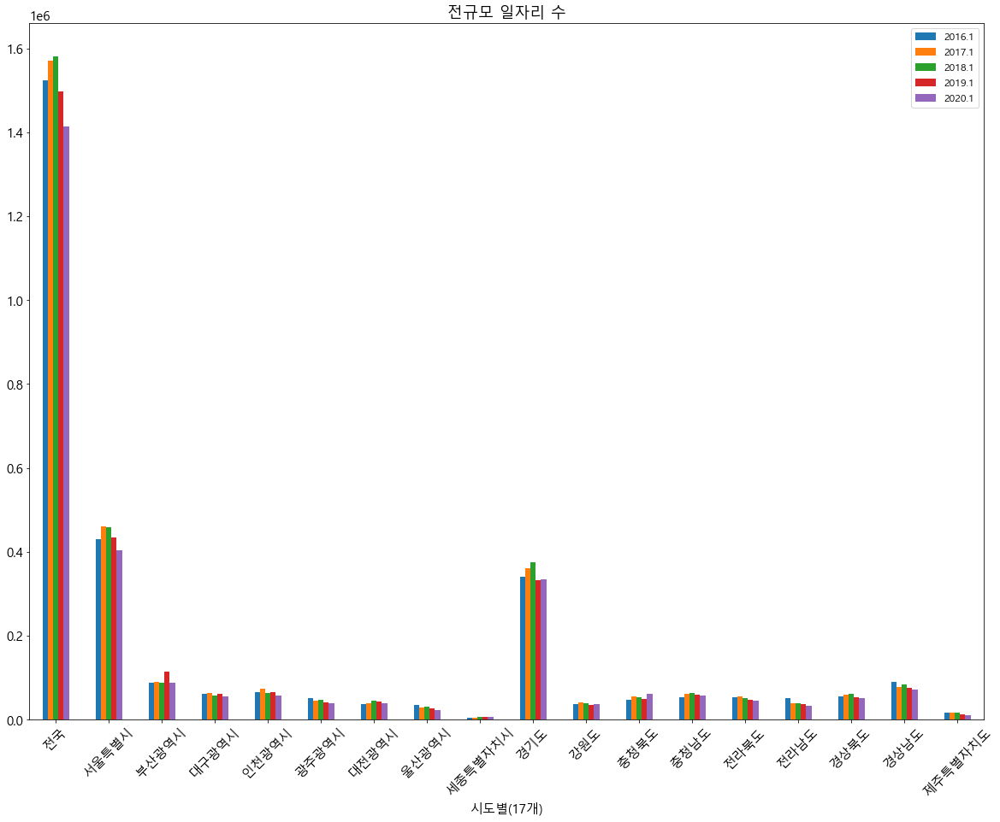

In [75]:
# df_6.drop(index = 1, inplace = True)
# df_6 = df_6.reset_index()
# df_6.drop(columns = 'index', inplace = True)
# df_6
df_6 = df_6.reset_index(drop=True)

df_6_1 = df_6[['시도별(17개)','2016.1', '2017.1', '2018.1', '2019.1', '2020.1']]

index = list(df_6_1.iloc[:,0])

df_6_1.set_index('시도별(17개)').plot(kind = 'bar', rot = 0, figsize = (20, 15))

plt.rc('font', size = 15, family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False
plt.xticks(rotation = 45)
plt.legend(fontsize = '12')
plt. title('전규모 일자리 수')
plt.show()

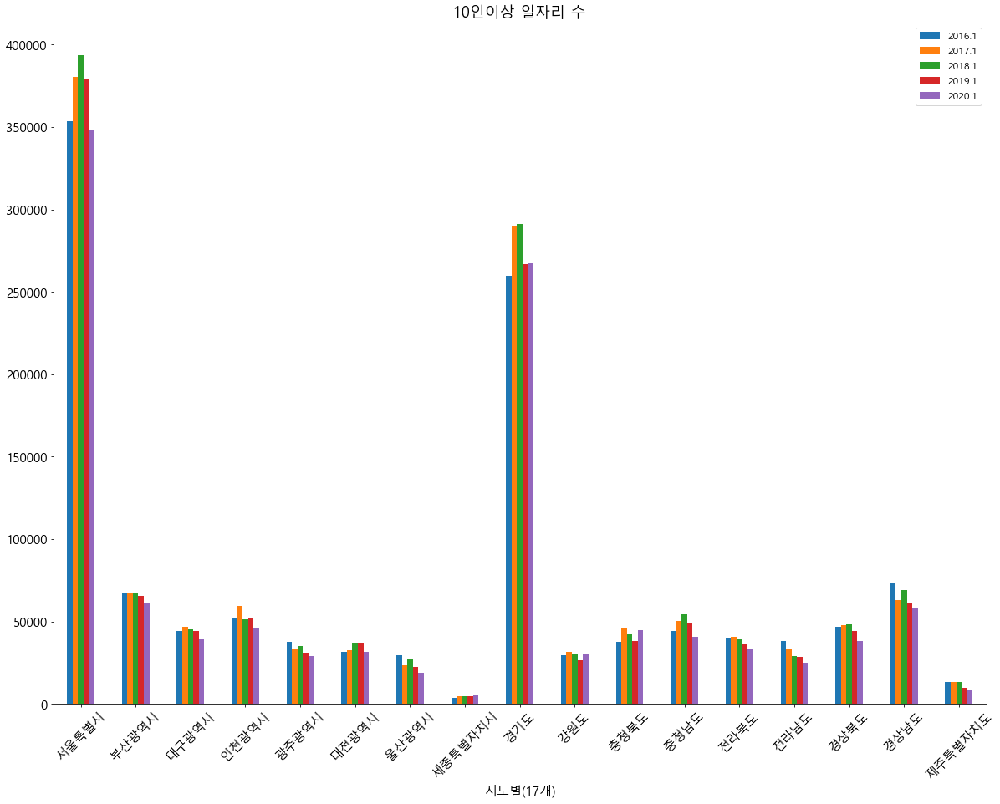

In [76]:
df_0 = df_0.reset_index(drop=True)

df_0_1 = df_0[['시도별(17개)','2016.1', '2017.1', '2018.1', '2019.1', '2020.1']].drop(index = 0)

index = list(df_0_1.iloc[:,0])

df_0_1.set_index('시도별(17개)').plot(kind = 'bar', rot = 0, figsize = (20, 15))

plt.rc('font', size = 15, family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False
plt.xticks(rotation = 45)
plt.legend(fontsize = '12')
plt. title('10인이상 일자리 수')
plt.show()

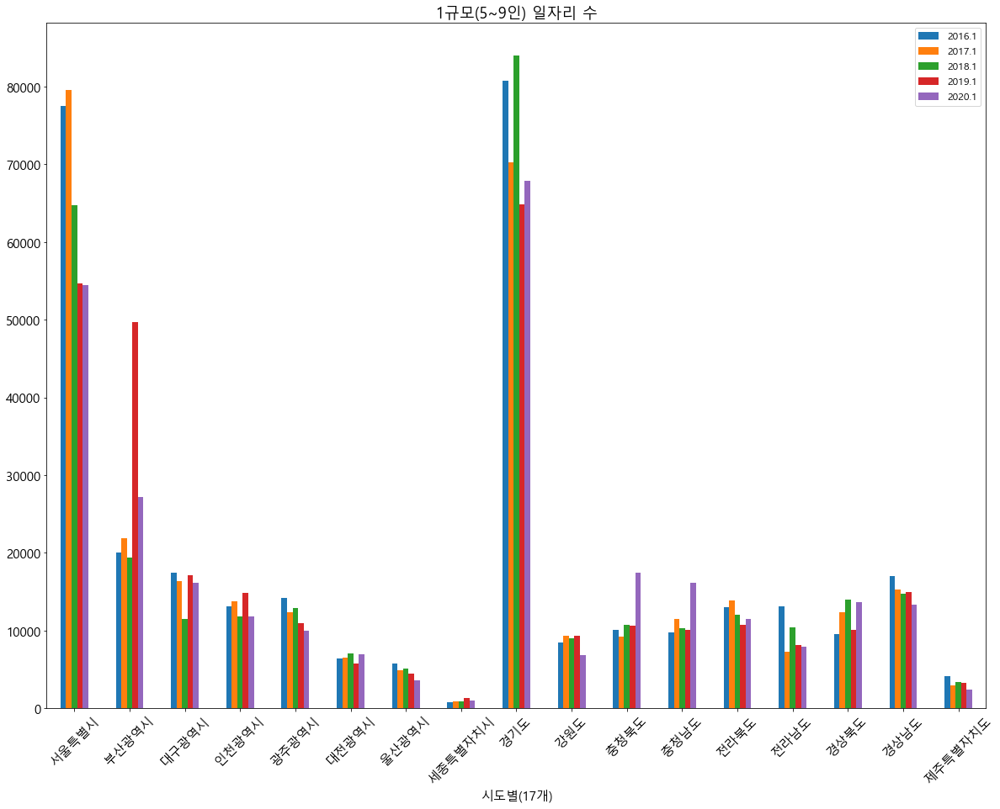

In [77]:
df_1 = df_1.reset_index(drop=True)

df_1_1 = df_1[['시도별(17개)','2016.1', '2017.1', '2018.1', '2019.1', '2020.1']].drop(index = 0)

index = list(df_1_1.iloc[:,0])

df_1_1.set_index('시도별(17개)').plot(kind = 'bar', rot = 0, figsize = (20, 15))

plt.rc('font', size = 15, family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False
plt.xticks(rotation = 45)
plt.legend(fontsize = '12')
plt. title('1규모(5~9인) 일자리 수')
plt.show()

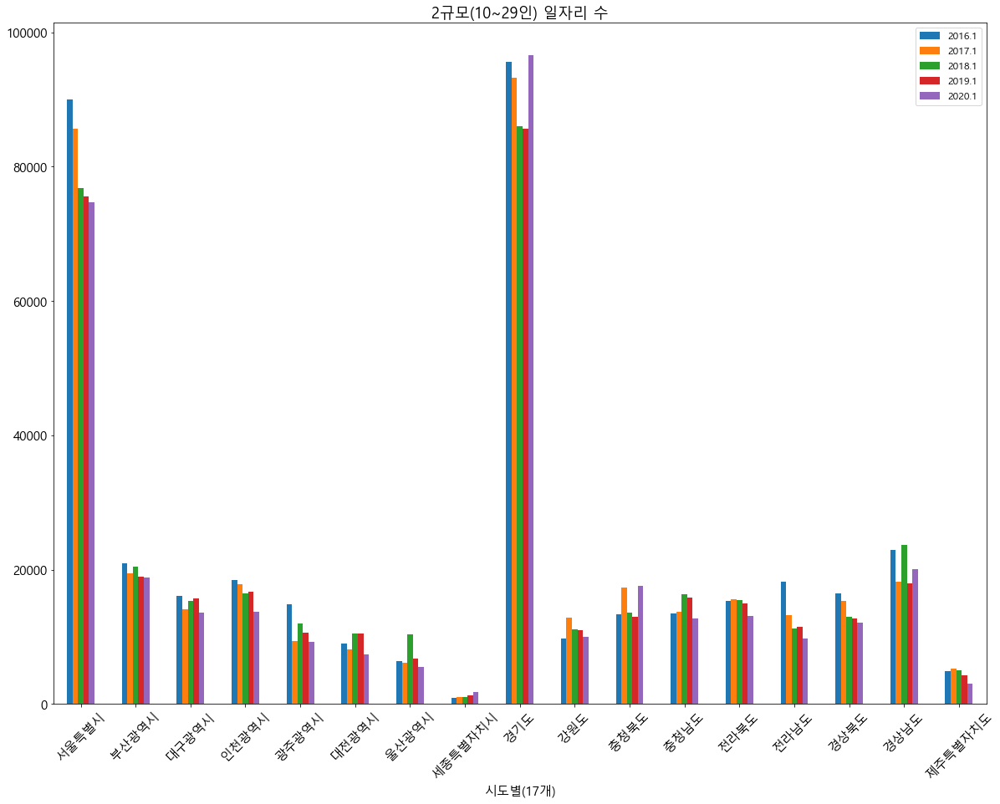

In [78]:
df_2 = df_2.reset_index(drop=True)

df_2_1 = df_2[['시도별(17개)','2016.1', '2017.1', '2018.1', '2019.1', '2020.1']].drop(index = 0)

index = list(df_2_1.iloc[:,0])

df_2_1.set_index('시도별(17개)').plot(kind = 'bar', rot = 0, figsize = (20, 15))

plt.rc('font', size = 15, family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False
plt.xticks(rotation = 45)
plt.legend(fontsize = '12')
plt. title('2규모(10~29인) 일자리 수')
plt.show()

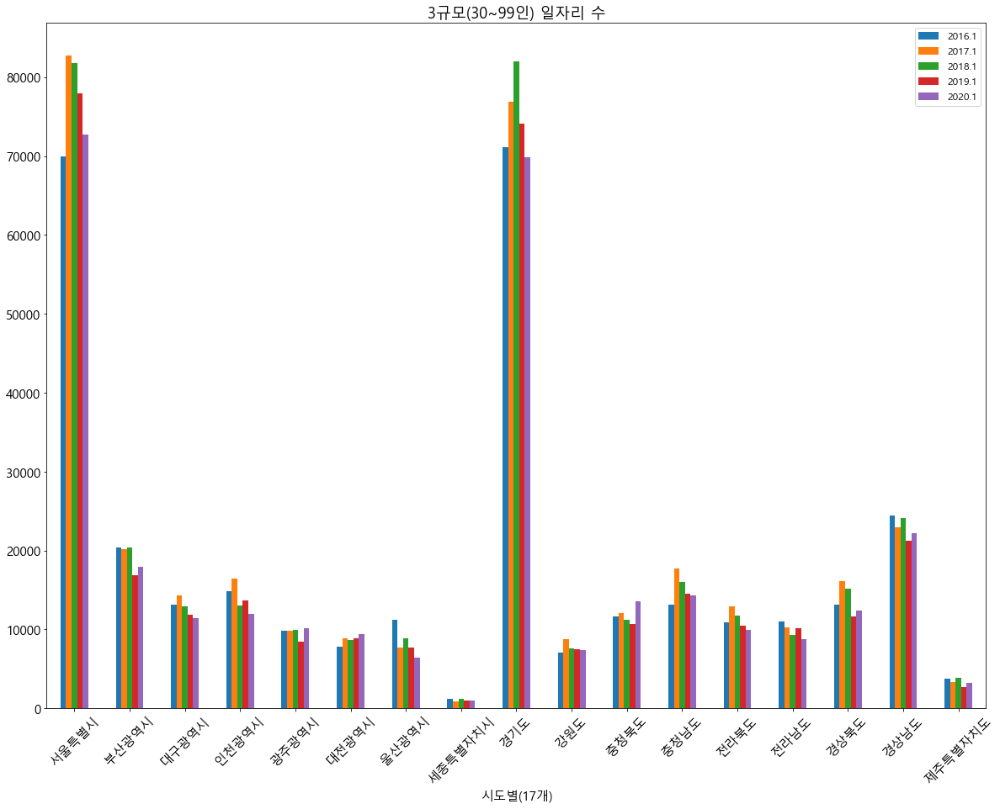

In [79]:
df_3 = df_3.reset_index(drop=True)

df_3_1 = df_3[['시도별(17개)','2016.1', '2017.1', '2018.1', '2019.1', '2020.1']].drop(index = 0)

index = list(df_3_1.iloc[:,0])

df_3_1.set_index('시도별(17개)').plot(kind = 'bar', rot = 0, figsize = (20, 15))

plt.rc('font', size = 15, family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False
plt.xticks(rotation = 45)
plt.legend(fontsize = '12')
plt. title('3규모(30~99인) 일자리 수')
plt.show()

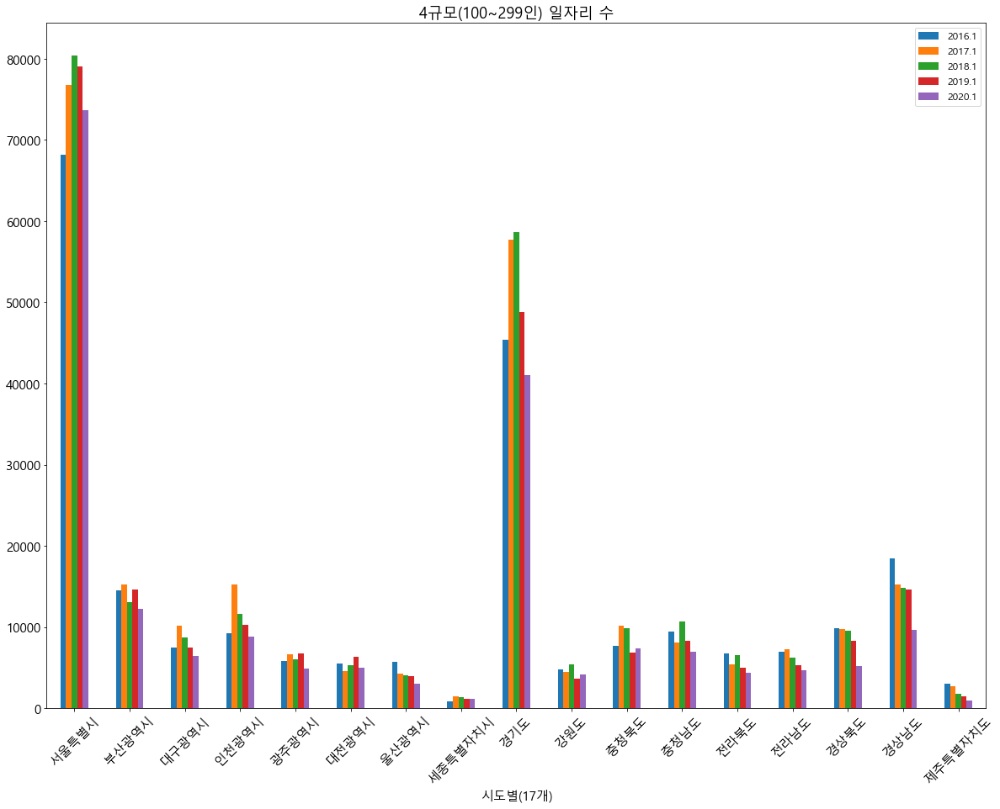

In [80]:
df_4 = df_4.reset_index(drop=True)

df_4_1 = df_4[['시도별(17개)','2016.1', '2017.1', '2018.1', '2019.1', '2020.1']].drop(index = 0)

index = list(df_4_1.iloc[:,0])

df_4_1.set_index('시도별(17개)').plot(kind = 'bar', rot = 0, figsize = (20, 15))

plt.rc('font', size = 15, family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False
plt.xticks(rotation = 45)
plt.legend(fontsize = '12')
plt. title('4규모(100~299인) 일자리 수')
plt.show()

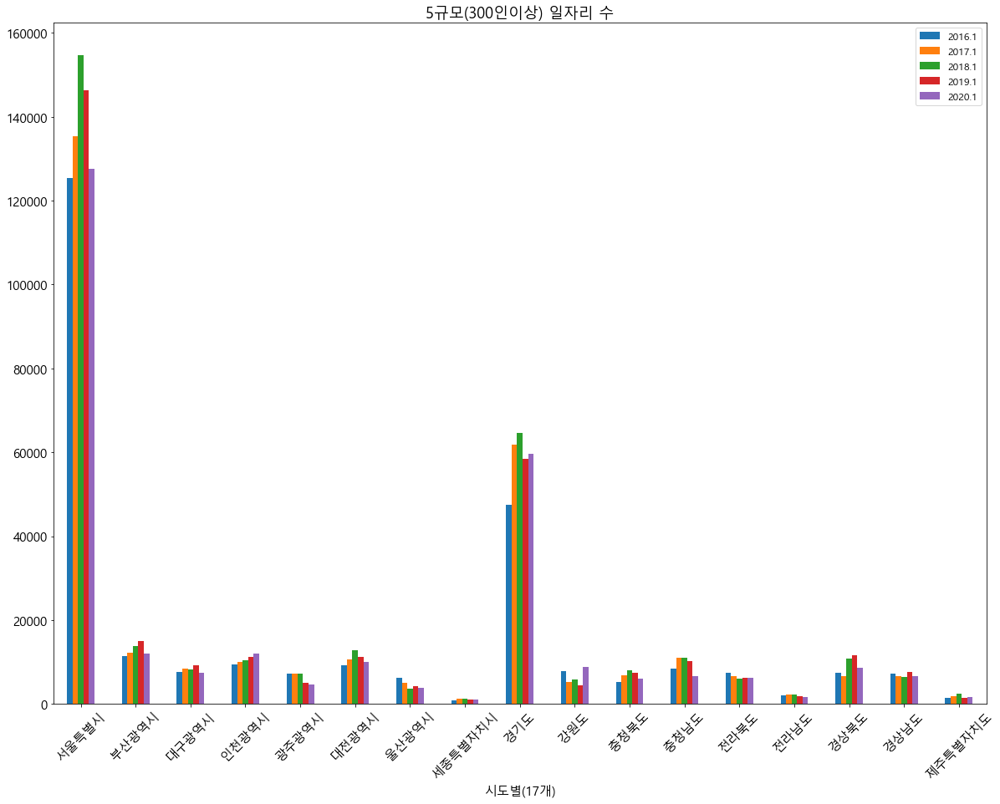

In [81]:
df_5 = df_5.reset_index(drop=True)

df_5_1 = df_5[['시도별(17개)','2016.1', '2017.1', '2018.1', '2019.1', '2020.1']].drop(index = 0)

index = list(df_5_1.iloc[:,0])

df_5_1.set_index('시도별(17개)').plot(kind = 'bar', rot = 0, figsize = (20, 15))

plt.rc('font', size = 15, family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False
plt.xticks(rotation = 45)
plt.legend(fontsize = '12')
plt. title('5규모(300인이상) 일자리 수')
plt.show()

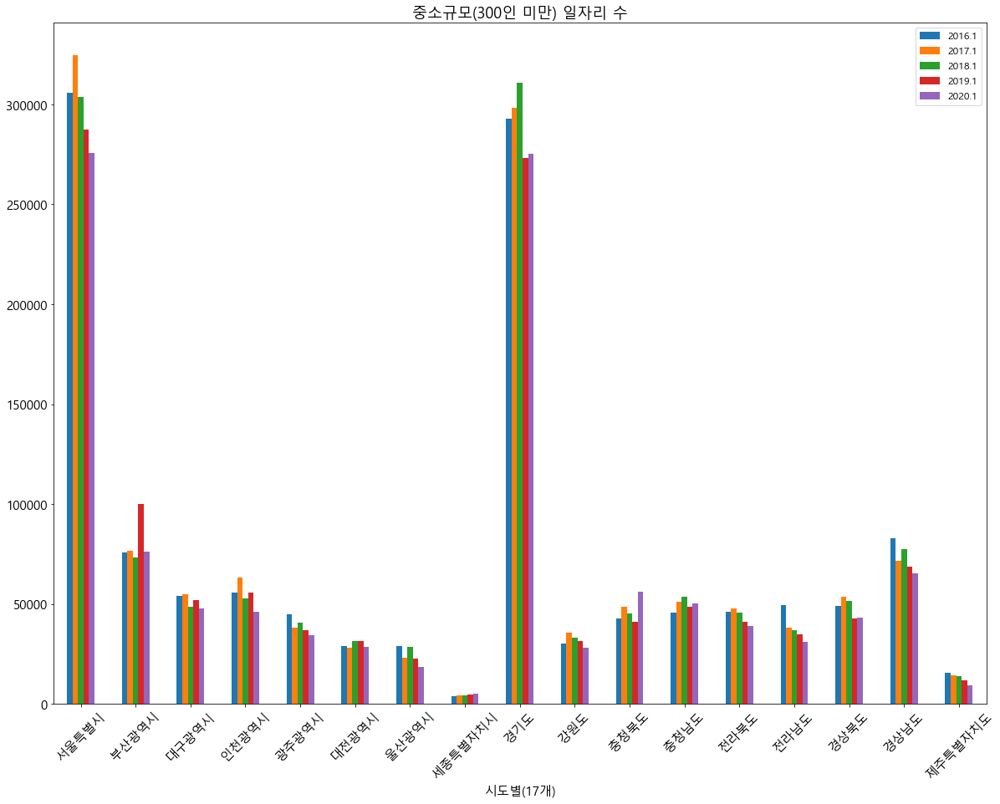

In [82]:
df_7 = df_7.reset_index(drop=True)

df_7_1 = df_7[['시도별(17개)','2016.1', '2017.1', '2018.1', '2019.1', '2020.1']].drop(index = 0)

index = list(df_7_1.iloc[:,0])

df_7_1.set_index('시도별(17개)').plot(kind = 'bar', rot = 0, figsize = (20, 15))

plt.rc('font', size = 15, family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False
plt.xticks(rotation = 45)
plt.legend(fontsize = '12')
plt. title('중소규모(300인 미만) 일자리 수')
plt.show()

## Correlation

In [89]:
df_pop = pd.read_csv(os.path.join(data_dir, data_list[1]), encoding = 'cp949')
df_pop.drop(index = [0,1,2,3], columns = '2015', inplace = True)
df_pop = df_pop.reset_index(drop=True)
df_pop

,행정구역별(읍면동),2016,2017,2018,2019,2020
0,서울특별시,9805506,9741871,9673936,9639541,9586195
1,부산광역시,3440484,3416918,3395278,3372692,3349016
2,대구광역시,2461002,2453041,2444412,2429940,2410700
3,인천광역시,2913024,2925967,2936117,2952237,2945454
4,광주광역시,1501557,1496172,1490092,1489730,1477573
5,대전광역시,1535445,1525849,1511214,1498839,1488435
6,울산광역시,1166033,1157077,1150116,1143692,1135423
7,세종특별자치시,242507,276589,312374,338136,353933
8,경기도,12671956,12851601,13103188,13300900,13511676
9,강원도,1521751,1521386,1520391,1520127,1521763


In [95]:
df_6_2 = df_6_1.drop(index = 0, columns = '시도별(17개)').reset_index(drop = True)
df_6_2

,2016.1,2017.1,2018.1,2019.1,2020.1
0,430926.0,460200.0,458465.0,433650.0,403104.0
1,87219.0,89100.0,87062.0,115203.0,88194.0
2,61727.0,63374.0,56610.0,61357.0,55048.0
3,65119.0,73404.0,63290.0,66668.0,58188.0
4,51953.0,45382.0,48062.0,41833.0,38804.0
5,37940.0,38831.0,44330.0,42833.0,38653.0
6,35448.0,28084.0,32052.0,26941.0,22524.0
7,4460.0,5552.0,5653.0,5838.0,6042.0
8,340295.0,360002.0,375366.0,331762.0,335069.0
9,37844.0,40709.0,38803.0,35804.0,37180.0


In [99]:
df_pop

,행정구역별(읍면동),2016,2017,2018,2019,2020
0,서울특별시,9805506,9741871,9673936,9639541,9586195
1,부산광역시,3440484,3416918,3395278,3372692,3349016
2,대구광역시,2461002,2453041,2444412,2429940,2410700
3,인천광역시,2913024,2925967,2936117,2952237,2945454
4,광주광역시,1501557,1496172,1490092,1489730,1477573
5,대전광역시,1535445,1525849,1511214,1498839,1488435
6,울산광역시,1166033,1157077,1150116,1143692,1135423
7,세종특별자치시,242507,276589,312374,338136,353933
8,경기도,12671956,12851601,13103188,13300900,13511676
9,강원도,1521751,1521386,1520391,1520127,1521763


In [108]:
df_pop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17 entries, 0 to 16
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   행정구역별(읍면동)  17 non-null     object
 1   2016        17 non-null     int64 
 2   2017        17 non-null     int64 
 3   2018        17 non-null     int64 
 4   2019        17 non-null     int64 
 5   2020        17 non-null     int64 
dtypes: int64(5), object(1)
memory usage: 944.0+ bytes


In [109]:
df_pop_job = pd.concat([df_pop,df_6_2], axis = 1)

In [110]:
df_pop_job

,행정구역별(읍면동),2016,2017,2018,2019,2020,2016.1,2017.1,2018.1,2019.1,2020.1
0,서울특별시,9805506,9741871,9673936,9639541,9586195,430926.0,460200.0,458465.0,433650.0,403104.0
1,부산광역시,3440484,3416918,3395278,3372692,3349016,87219.0,89100.0,87062.0,115203.0,88194.0
2,대구광역시,2461002,2453041,2444412,2429940,2410700,61727.0,63374.0,56610.0,61357.0,55048.0
3,인천광역시,2913024,2925967,2936117,2952237,2945454,65119.0,73404.0,63290.0,66668.0,58188.0
4,광주광역시,1501557,1496172,1490092,1489730,1477573,51953.0,45382.0,48062.0,41833.0,38804.0
5,대전광역시,1535445,1525849,1511214,1498839,1488435,37940.0,38831.0,44330.0,42833.0,38653.0
6,울산광역시,1166033,1157077,1150116,1143692,1135423,35448.0,28084.0,32052.0,26941.0,22524.0
7,세종특별자치시,242507,276589,312374,338136,353933,4460.0,5552.0,5653.0,5838.0,6042.0
8,경기도,12671956,12851601,13103188,13300900,13511676,340295.0,360002.0,375366.0,331762.0,335069.0
9,강원도,1521751,1521386,1520391,1520127,1521763,37844.0,40709.0,38803.0,35804.0,37180.0


In [111]:
corr = df_pop_job.corr(method = 'pearson')

In [113]:
corr = pd.DataFrame(corr)

In [114]:
corr

,2016,2017,2018,2019,2020,2016.1,2017.1,2018.1,2019.1,2020.1
2016,1.000000,0.999912,0.999560,0.999147,0.998536,0.950872,0.948980,0.955338,0.945998,0.957409
2017,0.999912,1.000000,0.999865,0.999606,0.999161,0.947468,0.945627,0.952317,0.942302,0.954449
2018,0.999560,0.999865,1.000000,0.999931,0.999697,0.942965,0.941151,0.948260,0.937426,0.950479
2019,0.999147,0.999606,0.999931,1.000000,0.999915,0.939744,0.937970,0.945362,0.933915,0.947633
2020,0.998536,0.999161,0.999697,0.999915,1.000000,0.936044,0.934265,0.941985,0.929894,0.944329
2016.1,0.950872,0.947468,0.942965,0.939744,0.936044,1.000000,0.998657,0.998576,0.996434,0.996910
2017.1,0.948980,0.945627,0.941151,0.937970,0.934265,0.998657,1.000000,0.999088,0.997393,0.998487
2018.1,0.955338,0.952317,0.948260,0.945362,0.941985,0.998576,0.999088,1.000000,0.996123,0.998814
2019.1,0.945998,0.942302,0.937426,0.933915,0.929894,0.996434,0.997393,0.996123,1.000000,0.996810
2020.1,0.957409,0.954449,0.950479,0.947633,0.944329,0.996910,0.998487,0.998814,0.996810,1.000000


## 인구수별 일자리 수 비율

In [ ]:
##인구당 일자리 수 비율 구해서 시각화

In [125]:
for i in range(2016, 2021):
    df_pop_job['{}.2'.format(i)] = df_pop_job['{}.1'.format(i)]*100/df_pop_job['{}'.format(i)]

In [126]:
df_pop_job

,행정구역별(읍면동),2016,2017,2018,2019,2020,2016.1,2017.1,2018.1,2019.1,2020.1,2016.2,2017.2,2018.2,2019.2,2020.2
0,서울특별시,9805506,9741871,9673936,9639541,9586195,430926.0,460200.0,458465.0,433650.0,403104.0,4.394735,4.723939,4.739178,4.498658,4.205047
1,부산광역시,3440484,3416918,3395278,3372692,3349016,87219.0,89100.0,87062.0,115203.0,88194.0,2.535079,2.607613,2.564208,3.415758,2.633430
2,대구광역시,2461002,2453041,2444412,2429940,2410700,61727.0,63374.0,56610.0,61357.0,55048.0,2.508206,2.583487,2.315894,2.525042,2.283486
3,인천광역시,2913024,2925967,2936117,2952237,2945454,65119.0,73404.0,63290.0,66668.0,58188.0,2.235443,2.508709,2.155568,2.258220,1.975519
4,광주광역시,1501557,1496172,1490092,1489730,1477573,51953.0,45382.0,48062.0,41833.0,38804.0,3.459942,3.033207,3.225438,2.808093,2.626199
5,대전광역시,1535445,1525849,1511214,1498839,1488435,37940.0,38831.0,44330.0,42833.0,38653.0,2.470945,2.544878,2.933403,2.857745,2.596889
6,울산광역시,1166033,1157077,1150116,1143692,1135423,35448.0,28084.0,32052.0,26941.0,22524.0,3.040051,2.427150,2.786849,2.355617,1.983754
7,세종특별자치시,242507,276589,312374,338136,353933,4460.0,5552.0,5653.0,5838.0,6042.0,1.839122,2.007310,1.809690,1.726524,1.707103
8,경기도,12671956,12851601,13103188,13300900,13511676,340295.0,360002.0,375366.0,331762.0,335069.0,2.685418,2.801223,2.864692,2.494282,2.479848
9,강원도,1521751,1521386,1520391,1520127,1521763,37844.0,40709.0,38803.0,35804.0,37180.0,2.486872,2.675784,2.552172,2.355330,2.443219


In [115]:
import seaborn as sns
plt.rcParams['figure.figsize'] = [10,8]

## Data visualization

In [5]:
state_geo = 'TL_SCCO_CTPRVN_WGS84.json'

In [16]:
state_geo = json.load(open(os.path.join(data_dir,data_list[3]), encoding='utf-8'))

In [18]:
state_geo

{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'geometry': {'type': 'MultiPolygon',
    'coordinates': [[[[129.34455, 37.1713],
       [129.34466, 37.17133],
       [129.34502, 37.17129],
       [129.3451, 37.17133],
       [129.34507, 37.17151],
       [129.34502, 37.1716],
       [129.34472, 37.17166],
       [129.34471, 37.17172],
       [129.3449, 37.17177],
       [129.34504, 37.17182],
       [129.34503, 37.1719],
       [129.3449, 37.17194],
       [129.3448, 37.1719],
       [129.34458, 37.17191],
       [129.34449, 37.17182],
       [129.34424, 37.17176],
       [129.34456, 37.17139],
       [129.34455, 37.1713]]],
     [[[129.36567, 37.16516],
       [129.36565, 37.17056],
       [129.35787, 37.1794],
       [129.3577, 37.17931],
       [129.36545, 37.17051],
       [129.36547, 37.16516],
       [129.36567, 37.16516]]],
     [[[129.32673, 37.28351],
       [129.32684, 37.28364],
       [129.32701, 37.28376],
       [129.32713, 37.28381],
       [129.32712,

In [120]:
df_6.drop(index = 0,inplace = True)

In [1]:
# # Initialize the map:
# m = folium.Map(location=[36, 127], tiles="OpenStreetMap", zoom_start=7)

# choropleth = folium.Choropleth(
#     geo_data=state_geo,
#     name='전규모',
#     data=df_6,
#     columns=['시도별(17개)', '2016.1'],
#     key_on='feature.properties.CTP_KOR_NM',
#     fill_color='YlOrRd',
#     fill_opacity=0.7,
#     line_opacity=0.3,
#     color = 'gray',
#     legend_name = 'job'
# ).add_to(m)


# choropleth = folium.Choropleth(
#     geo_data=state_geo,
#     name='10인이상',
#     data=df_0,
#     columns=['시도별(17개)', '2016.1'],
#     key_on='feature.properties.CTP_KOR_NM',
#     fill_color='YlOrRd',
#     fill_opacity=0.7,
#     line_opacity=0.3,
#     color = 'gray',
#     legend_name = 'job'
# ).add_to(m)


# choropleth = folium.Choropleth(
#     geo_data=state_geo,
#     name='중소규모',
#     data=df_7,
#     columns=['시도별(17개)', '2016.1'],
#     key_on='feature.properties.CTP_KOR_NM',
#     fill_color='YlOrRd',
#     fill_opacity=0.7,
#     line_opacity=0.3,
#     color = 'gray',
#     legend_name = 'job'
# ).add_to(m)


# choropleth = folium.Choropleth(
#     geo_data=state_geo,
#     name='1규모',
#     data=df_1,
#     columns=['시도별(17개)', '2016.1'],
#     key_on='feature.properties.CTP_KOR_NM',
#     fill_color='YlOrRd',
#     fill_opacity=0.7,
#     line_opacity=0.3,
#     color = 'gray',
#     legend_name = 'job'
# ).add_to(m)


# choropleth = folium.Choropleth(
#     geo_data=state_geo,
#     name='2규모',
#     data=df_2,
#     columns=['시도별(17개)', '2016.1'],
#     key_on='feature.properties.CTP_KOR_NM',
#     fill_color='YlOrRd',
#     fill_opacity=0.7,
#     line_opacity=0.3,
#     color = 'gray',
#     legend_name = 'job'
# ).add_to(m)


# choropleth = folium.Choropleth(
#     geo_data=state_geo,
#     name='3규모',
#     data=df_3,
#     columns=['시도별(17개)', '2016.1'],
#     key_on='feature.properties.CTP_KOR_NM',
#     fill_color='YlOrRd',
#     fill_opacity=0.7,
#     line_opacity=0.3,
#     color = 'gray',
#     legend_name = 'job'
# ).add_to(m)


# choropleth = folium.Choropleth(
#     geo_data=state_geo,
#     name='4규모',
#     data=df_4,
#     columns=['시도별(17개)', '2016.1'],
#     key_on='feature.properties.CTP_KOR_NM',
#     fill_color='YlOrRd',
#     fill_opacity=0.7,
#     line_opacity=0.3,
#     color = 'gray',
#     legend_name = 'job'
# ).add_to(m)


# choropleth = folium.Choropleth(
#     geo_data=state_geo,
#     name='5규모',
#     data=df_5,
#     columns=['시도별(17개)', '2016.1'],
#     key_on='feature.properties.CTP_KOR_NM',
#     fill_color='YlOrRd',
#     fill_opacity=0.7,
#     line_opacity=0.3,
#     color = 'gray',
#     legend_name = 'job'
# ).add_to(m)


# choropleth.geojson.add_child(folium.features.GeoJsonTooltip(['CTP_KOR_NM'], labels=False))
# title_html = '<h3 align="center" style="font-size:20px"><b>people index </b></h3>'
# m.get_root().html.add_child(folium.Element(title_html))
# folium.LayerControl().add_to(m)

# # Save to html
# # m.save('folium_kr.html')

# m

In [2]:
# m = folium.Map(location=[36, 127], tiles="OpenStreetMap", zoom_start=7)

# choropleth = folium.Choropleth(
#     geo_data=state_geo,
#     name='2016',
#     data=df_pop_job,
#     columns=['행정구역별(읍면동)', '2016.2'],
#     key_on='feature.properties.CTP_KOR_NM',
#     fill_color='YlOrRd',
#     fill_opacity=0.7,
#     line_opacity=0.3,
#     color = 'gray',
#     legend_name = 'job'
# ).add_to(m)

# choropleth = folium.Choropleth(
#     geo_data=state_geo,
#     name='2017',
#     data=df_pop_job,
#     columns=['행정구역별(읍면동)', '2017.2'],
#     key_on='feature.properties.CTP_KOR_NM',
#     fill_color='YlOrRd',
#     fill_opacity=0.7,
#     line_opacity=0.3,
#     color = 'gray',
#     legend_name = 'job'
# ).add_to(m)

# choropleth = folium.Choropleth(
#     geo_data=state_geo,
#     name='2018',
#     data=df_pop_job,
#     columns=['행정구역별(읍면동)', '2018.2'],
#     key_on='feature.properties.CTP_KOR_NM',
#     fill_color='YlOrRd',
#     fill_opacity=0.7,
#     line_opacity=0.3,
#     color = 'gray',
#     legend_name = 'job'
# ).add_to(m)

# choropleth = folium.Choropleth(
#     geo_data=state_geo,
#     name='2019',
#     data=df_pop_job,
#     columns=['행정구역별(읍면동)', '2019.2'],
#     key_on='feature.properties.CTP_KOR_NM',
#     fill_color='YlOrRd',
#     fill_opacity=0.7,
#     line_opacity=0.3,
#     color = 'gray',
#     legend_name = 'job'
# ).add_to(m)

# choropleth = folium.Choropleth(
#     geo_data=state_geo,
#     name='2020',
#     data=df_pop_job,
#     columns=['행정구역별(읍면동)', '2020.2'],
#     key_on='feature.properties.CTP_KOR_NM',
#     fill_color='YlOrRd',
#     fill_opacity=0.7,
#     line_opacity=0.3,
#     color = 'gray',
#     legend_name = 'job'
# ).add_to(m)

# choropleth.geojson.add_child(folium.features.GeoJsonTooltip(['CTP_KOR_NM'], labels=False))
# title_html = '<h3 align="center" style="font-size:20px"><b>people index </b></h3>'
# m.get_root().html.add_child(folium.Element(title_html))
# folium.LayerControl().add_to(m)

# # Save to html
# # m.save('folium_kr.html')

# m